In [14]:
!pip install ydata-profiling -q
!pip install ipywidgets -q


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import missingno as msno
import ydata_profiling as ppf
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [2]:
ls -a Data

 Volume in drive G is Anggita
 Volume Serial Number is 967F-504A

 Directory of g:\#Mini Project\DSC-Gammafest-2023


 Directory of g:\#Mini Project\DSC-Gammafest-2023\Data

13/05/2023  00:28    <DIR>          .
13/05/2023  00:28    <DIR>          ..
09/05/2023  12:24           116.793 sample_submission.csv
09/05/2023  12:24         1.090.929 test.csv
09/05/2023  12:24         3.753.266 train.csv
13/05/2023  00:26           841.077 water-feasibility-prediction-gammafest.zip
               4 File(s)      5.802.065 bytes
               2 Dir(s)  550.355.668.992 bytes free


File Not Found


In [40]:
train = pd.read_csv('Data/train.csv', index_col='id')
test = pd.read_csv('Data/test.csv', index_col='id')
train.dropna(subset=['DC201'], inplace=True)
y = train['DC201']
train.drop('DC201', axis=1, inplace=True)

In [47]:
edu_map = {'Layak Minum': 1, 'Tidak Layak Minum': 0}
# Map the categories to integer values
y = y.map(edu_map)

In [27]:
y.value_counts()

1.0    32398
0.0     3572
Name: DC201, dtype: int64

In [3]:
ppf.ProfileReport(train)

Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.74s/it]


In [79]:
798/32166

0.02480880432755083

In [35]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_unique_value_counts(df):
    # Create a count plot of the unique values in the column
    plt.figure(figsize=(10, 8))
    sns.countplot(x=df, data=df, order=df.value_counts().index)
    plt.title(f'Unique Value Counts in Column "{df.name}"')
    plt.xlabel('Value')
    plt.ylabel('Count')

    value_counts = df.value_counts()
    for i, count in enumerate(value_counts):
        plt.text(i, count, str(count), ha='center', fontsize=14)

    # Calculate and add CIR annotation
    num_minority = value_counts.min()
    num_majority = value_counts.max()
    CIR = num_majority / num_minority
    plt.text(len(value_counts) / 2, num_majority,
             f'CIR: {CIR:.2f}', ha='center', fontsize=14, weight='bold')
        
    plt.show()


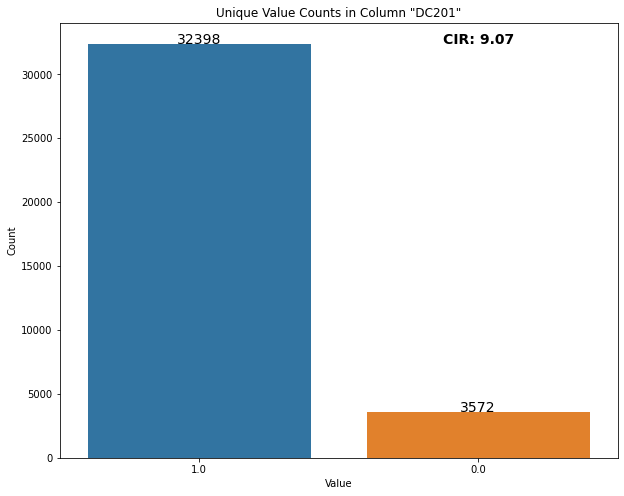

In [36]:
plot_unique_value_counts(y)

**Our Problem**<br>
- Missing Value presence in train but not in test
- Highly correlated features
- imbalance labels target data

# Simple Modelling

In [51]:
train2 = pd.read_csv('Data/train.csv', index_col='id')
train2.dropna(subset=['DC201'], inplace=True)
y = train2['DC201']
train2.drop('DC201', axis=1, inplace=True)
edu_map = {'Layak Minum': 1, 'Tidak Layak Minum': 0}
# Map the categories to integer values
y = y.map(edu_map)

In [45]:
from catboost import CatBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import cross_validate

In [57]:
cat_clf = CatBoostClassifier(
    verbose=False,
    auto_class_weights='Balanced',
    eval_metric='F1'
)

In [59]:
catcv2 = cross_validate(cat_clf, train2, y, cv=6, scoring='f1')['test_score']

In [58]:
hist_clf = HistGradientBoostingClassifier(
            class_weight='balanced',
            learning_rate=0.1,
            max_leaf_nodes=None,
            min_samples_leaf=20,
            random_state=42,
            verbose=0,
            scoring='f1'
)

In [60]:
histcv2 = cross_validate(hist_clf, train2, y, cv=6, scoring='f1')['test_score']

In [50]:
print(catcv.mean())
print(histcv.mean())

0.7557224058110067
0.8391753587268299


In [56]:
print(catcv2.mean())
print(histcv2.mean())

0.7557224058110067
0.8391753587268299


## 2

In [68]:
train = pd.read_csv('Data/train.csv')
test = pd.read_csv('Data/test.csv')

In [69]:
train_drop = train.drop([train.index[17476], train.index[30024], train.index[30841]])

In [70]:
X_with_nan = train_drop.drop('id', axis=1)
y= train_drop['DC201']
y = y.replace(['Layak Minum','Tidak Layak Minum'],
              [1,0])

In [71]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(sparse=False)
enc.fit(X_with_nan)
cols = enc.get_feature_names_out()
dummies_nan = pd.DataFrame(enc.transform(X_with_nan), columns=cols)
dummies_nan.drop(['DC201_Layak Minum', 'DC201_Tidak Layak Minum'], axis=1, inplace = True)

c:\Users\HANIF\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [76]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, HistGradientBoostingClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegressionCV

# Ini ni salah satunya
from sklearn.model_selection import KFold, cross_val_score

def auto_model_pake_cv(X, y):
  # Tulis semua model yg mau dibikin jadi sebuah list kayak gini
  daftar_model_kita = [ AdaBoostClassifier(),  RandomForestClassifier(), LogisticRegressionCV(), HistGradientBoostingClassifier(), LGBMClassifier(), XGBClassifier()]

  # Bikin CV buat daftar kerja
  # CV ini nanti otomatis dipakai oleh model
  cv_kita = KFold(n_splits = 6)

  # Siapin list buat nyimpen nilai metrics nya, bebas sih mau pilih apa aja

  formula_1 = []

  # Looping deh 
  for model in daftar_model_kita:
    # Ga usah fit & predict2 lagi bang, langsung kita hitung metricsnya
    formula_1.append(np.mean(cross_val_score(model, X, y, cv = cv_kita, scoring = 'f1')))

  # Jadiin sebuah dataframe biar keren gituloh
  hasil = {
    'model' : daftar_model_kita,
    'formula_1' : formula_1,
  }

  # Balikin hasilnya
  return(pd.DataFrame(hasil))

In [ ]:
auto_model_pake_cv(dummies_nan, y)

In [ ]:
def objective(trial):
    params = {
        "objective": "binary",
        "metric": "None",  # Set metric to None since we'll calculate F1 score manually
        "boosting_type": trial.suggest_categorical("boosting_type", ["gbdt", "dart"]),
        "lambda_l1": trial.suggest_loguniform("lambda_l1", 1e-8, 10.0),
        "lambda_l2": trial.suggest_loguniform("lambda_l2", 1e-8, 10.0),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_uniform("feature_fraction", 0.1, 1.0),
        "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "num_iterations": trial.suggest_categorical("num_iterations", [100, 200, 500, 700, 1000, 1200, 1500]),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1)
    }

    model = LGBMClassifier(**params)

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="weighted")

    return f1

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

best_params = study.best_params
best_f1 = study.best_value

print("Best Parameters:", best_params)
print("Best F1 Score:", best_f1)